# YOLOv11 on Blood Cell Dataset

## Introduction

This notebook focuses on training and evaluating the YOLOv11 model for blood cell detection and classification. The dataset consists of images of different blood cell types, each labeled with corresponding bounding boxes. The key objectives of this notebook are:

- **Data Preparation:** Cleaning the dataset by removing incorrectly labeled images.
- **Model Training:** Fine-tuning the YOLOv11 model using a pretrained weight (`yolo11n.pt`).
- **Validation:** Performed on individual images.
- **Prediction:**  Applied to both combined and individual images.

For more details on YOLOv11, refer to the official [Ultralytics documentation](https://docs.ultralytics.com).

In [ ]:
%pip install ultralytics

In [9]:
%matplotlib inline
import os
import cv2
import random
import shutil
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np
from pathlib import Path
from collections import defaultdict

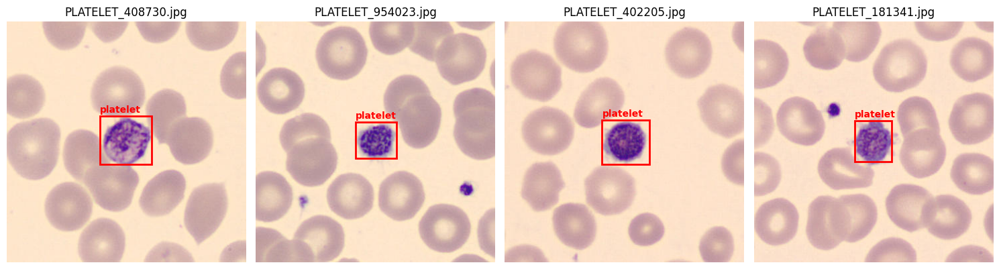

In [22]:
# Define paths
image_dir = "/Users/afnanag/projects/DH307/yolov11/data/platelet/images"
label_dir = "/Users/afnanag/projects/DH307/yolov11/data/platelet/labels"

# Class names (index corresponds to YOLO label)
class_names = ['basophil', 'eosinophil', 'erythroblast', 'immunoglobin', 
               'lymphocyte', 'monocyte', 'neutrophil', 'platelet', 'lymphoblast']

# Get all image files
image_files = [f for f in os.listdir(image_dir) if f.endswith('.jpg')]

# Select random images
num_images_to_display = 4
selected_images = random.sample(image_files, min(num_images_to_display, len(image_files)))

# Function to read labels and parse YOLO format
def load_yolo_labels(label_path):
    labels = []
    with open(label_path, 'r') as f:
        for line in f.readlines():
            parts = line.strip().split()
            class_id = int(parts[0])
            x_center, y_center, width, height = map(float, parts[1:])
            labels.append((class_id, x_center, y_center, width, height))
    return labels

# Plot images with bounding boxes
fig, axes = plt.subplots(1, len(selected_images), figsize=(15, 5))

for i, img_name in enumerate(selected_images):
    img_path = os.path.join(image_dir, img_name)
    label_path = os.path.join(label_dir, img_name.replace('.jpg', '.txt'))

    # Read image
    image = cv2.imread(img_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB for Matplotlib

    # Get image dimensions
    h, w, _ = image.shape

    # Read labels
    labels = load_yolo_labels(label_path)

    # Plot image
    ax = axes[i] if len(selected_images) > 1 else axes
    ax.imshow(image)
    ax.set_title(img_name)
    ax.axis("off")

    # Draw bounding boxes
    for class_id, x_center, y_center, width, height in labels:
        # Convert YOLO format to pixel values
        x_min = int((x_center - width / 2) * w)
        y_min = int((y_center - height / 2) * h)
        box_w = int(width * w)
        box_h = int(height * h)

        # Create rectangle
        rect = patches.Rectangle((x_min, y_min), box_w, box_h, linewidth=2, 
                                 edgecolor='red', facecolor='none')
        ax.add_patch(rect)
        ax.text(x_min, y_min - 5, class_names[class_id], color='red', fontsize=10, weight='bold')

plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()

## Prepare Train, Validation and Test Sets

In [23]:
# Define paths
base_dir = "/Users/afnanag/projects/DH307/yolov11/data"
all_images_dir = os.path.join(base_dir, "all_images")
all_labels_dir = os.path.join(base_dir, "all_labels")

# Create directories if they don't exist
os.makedirs(all_images_dir, exist_ok=True)
os.makedirs(all_labels_dir, exist_ok=True)

# List of class names
classes = ['basophil', 'eosinophil', 'erythroblast', 'ig', 
           'lymphocyte', 'monocyte', 'neutrophil', 'platelet', 'lymphoblast']

# Move images and labels into a single folder
for cls in classes:
    img_dir = os.path.join(base_dir, cls, "images")
    lbl_dir = os.path.join(base_dir, cls, "labels")

    if os.path.exists(img_dir):
        for img_name in os.listdir(img_dir):
            shutil.move(os.path.join(img_dir, img_name), os.path.join(all_images_dir, img_name))

    if os.path.exists(lbl_dir):
        for lbl_name in os.listdir(lbl_dir):
            shutil.move(os.path.join(lbl_dir, lbl_name), os.path.join(all_labels_dir, lbl_name))

print("All images and labels combined successfully!")


All images and labels combined successfully!


In [24]:
# Define train/val/test directories
train_img_dir = os.path.join(base_dir, "train/images")
train_lbl_dir = os.path.join(base_dir, "train/labels")
val_img_dir = os.path.join(base_dir, "val/images")
val_lbl_dir = os.path.join(base_dir, "val/labels")
test_img_dir = os.path.join(base_dir, "test/images")
test_lbl_dir = os.path.join(base_dir, "test/labels")

# Create train/val/test directories
for d in [train_img_dir, train_lbl_dir, val_img_dir, val_lbl_dir, test_img_dir, test_lbl_dir]:
    os.makedirs(d, exist_ok=True)

# Get all images
all_images = [f for f in os.listdir(all_images_dir) if f.endswith('.jpg')]

# Shuffle and split (70% train, 15% val, 15% test)
random.shuffle(all_images)
train_split = int(0.7 * len(all_images))
val_split = int(0.85 * len(all_images))  # 70% + 15% = 85%

train_files = all_images[:train_split]
val_files = all_images[train_split:val_split]
test_files = all_images[val_split:]

# Move images and labels to train/val/test folders
for file_list, img_dest, lbl_dest, split_name in [
    (train_files, train_img_dir, train_lbl_dir, "Train"),
    (val_files, val_img_dir, val_lbl_dir, "Validation"),
    (test_files, test_img_dir, test_lbl_dir, "Test")
]:
    for img_name in file_list:
        # Use copy instead of move to preserve original data
        shutil.copy(os.path.join(all_images_dir, img_name), os.path.join(img_dest, img_name))
        lbl_name = img_name.replace('.jpg', '.txt')
        shutil.copy(os.path.join(all_labels_dir, lbl_name), os.path.join(lbl_dest, lbl_name))
    print(f"{split_name} set: {len(file_list)} images")

print(f"Data split complete! Train: {len(train_files)}, Val: {len(val_files)}, Test: {len(test_files)}")

Train set: 12573 images
Validation set: 2694 images
Test set: 2695 images
Data split complete! Train: 12573, Val: 2694, Test: 2695


In [2]:
train_lbl_dir = '/Users/afnanag/projects/DH307/yolov11/data/train/labels'
test_lbl_dir = '/Users/afnanag/projects/DH307/yolov11/data/test/labels'
val_lbl_dir = '/Users/afnanag/projects/DH307/yolov11/data/val/labels'

In [4]:
import os
from collections import Counter

def count_class_instances(label_dir):
    class_counts = Counter()
    for lbl_file in os.listdir(label_dir):
        lbl_path = os.path.join(label_dir, lbl_file)
        with open(lbl_path, "r") as f:
            for line in f:
                class_id = line.split()[0]  # Assuming YOLO format (first value is class ID)
                class_counts[class_id] += 1  # Count occurrences
    return class_counts

# Count instances in each dataset
train_class_counts = count_class_instances(train_lbl_dir)
val_class_counts = count_class_instances(val_lbl_dir)
test_class_counts = count_class_instances(test_lbl_dir)

# Print results
print("Train class distribution:", dict(train_class_counts))
print("Validation class distribution:", dict(val_class_counts))
print("Test class distribution:", dict(test_class_counts))

# Get total count across all datasets
total_class_counts = train_class_counts + val_class_counts + test_class_counts
print("Total class distribution across all splits:", dict(total_class_counts))


Train class distribution: {'7': 1638, '2': 1092, '6': 2315, '5': 988, '3': 2048, '1': 2164, '0': 856, '8': 607, '4': 872}
Validation class distribution: {'3': 425, '4': 172, '1': 495, '6': 503, '5': 222, '7': 354, '2': 223, '8': 127, '0': 174}
Test class distribution: {'2': 236, '1': 458, '6': 511, '5': 210, '0': 197, '3': 422, '7': 356, '8': 136, '4': 170}
Total class distribution across all splits: {'7': 2348, '2': 1551, '6': 3329, '5': 1420, '3': 2895, '1': 3117, '0': 1227, '8': 870, '4': 1214}


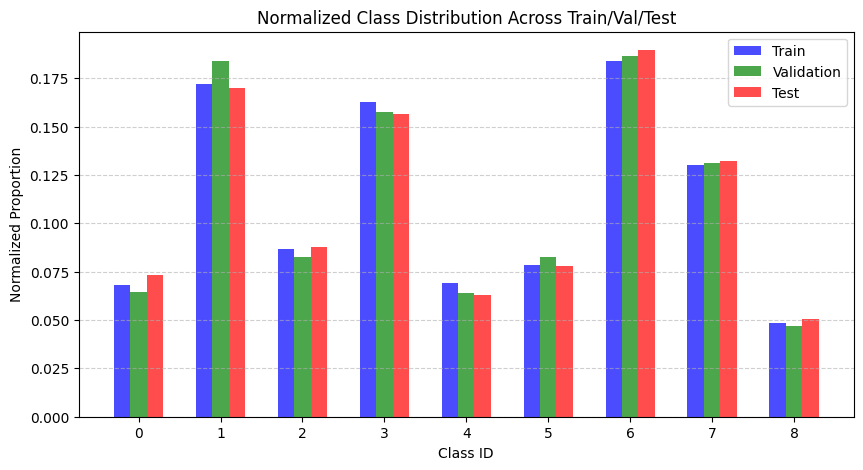

In [5]:
import os
import numpy as np
import matplotlib.pyplot as plt
from collections import Counter

def count_class_instances(label_dir):
    class_counts = Counter()
    for lbl_file in os.listdir(label_dir):
        lbl_path = os.path.join(label_dir, lbl_file)
        with open(lbl_path, "r") as f:
            for line in f:
                class_id = line.split()[0]  # Assuming YOLO format (first value is class ID)
                class_counts[class_id] += 1  # Count occurrences
    return class_counts

# Count instances in each dataset
train_class_counts = count_class_instances(train_lbl_dir)
val_class_counts = count_class_instances(val_lbl_dir)
test_class_counts = count_class_instances(test_lbl_dir)

# Get all class labels
all_classes = sorted(set(train_class_counts.keys()) | set(val_class_counts.keys()) | set(test_class_counts.keys()))

# Convert counts to lists (ensuring order)
train_counts = np.array([train_class_counts.get(c, 0) for c in all_classes])
val_counts = np.array([val_class_counts.get(c, 0) for c in all_classes])
test_counts = np.array([test_class_counts.get(c, 0) for c in all_classes])

# Normalize counts to get proportions
train_proportions = train_counts / train_counts.sum()
val_proportions = val_counts / val_counts.sum()
test_proportions = test_counts / test_counts.sum()

# Plot the distributions
plt.figure(figsize=(10, 5))
bar_width = 0.2
x = np.arange(len(all_classes))

plt.bar(x - bar_width, train_proportions, width=bar_width, label='Train', color='blue', alpha=0.7)
plt.bar(x, val_proportions, width=bar_width, label='Validation', color='green', alpha=0.7)
plt.bar(x + bar_width, test_proportions, width=bar_width, label='Test', color='red', alpha=0.7)

# Labels and Titles
plt.xlabel("Class ID")
plt.ylabel("Normalized Proportion")
plt.title("Normalized Class Distribution Across Train/Val/Test")
plt.xticks(x, all_classes)  # Set class labels on x-axis
plt.legend()
plt.grid(axis="y", linestyle="--", alpha=0.6)
plt.show()


## Train the Model

In [ ]:
from ultralytics import YOLO

model = YOLO("yolo11n.pt")  

model.train(
    data="/Users/afnanag/projects/DH307/yolov11/dataset.yaml",
    epochs=300,
    imgsz=384,
    batch=16,
    device="mps",
    optimizer="AdamW",
    lr0=0.001,
    dropout=0.1,
    patience=50,
    workers=8,
    mosaic=1.0,         # Mosaic: combines multiple images
    mixup=0.5,          # Mixup: blends images together
    cache=True,
)


## Resume Training

In [ ]:
from ultralytics import YOLO

model = YOLO("/Users/afnanag/projects/DH307/yolov11/runs/detect/train5/weights/last.pt")  

model.train(
    resume = True,
    data="/Users/afnanag/projects/DH307/yolov11/dataset.yaml",
    epochs=300,
    imgsz=384,
    batch=16,
    device="mps",
    optimizer="AdamW",
    lr0=0.001,
    dropout=0.1,
    patience=50,
    workers=8,
    mosaic=1.0,         # Mosaic: combines multiple images
    mixup=0.5,          # Mixup: blends images together
    cache=True,
)


## Prediction on Individual Images

In [7]:
from ultralytics import YOLO


image 1/1 /Users/afnanag/projects/DH307/yolov11/data/val/images/generated_68.jpg: 384x384 1 lymphoblast, 24.8ms
Speed: 1.2ms preprocess, 24.8ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 384)

image 1/1 /Users/afnanag/projects/DH307/yolov11/data/val/images/MMY_136680.jpg: 384x384 1 immature granulocyte, 23.0ms
Speed: 0.6ms preprocess, 23.0ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 384)

image 1/1 /Users/afnanag/projects/DH307/yolov11/data/val/images/ERB_307328_jpg.rf.16ea694b02bcde739ff247cd8cd501ce.jpg: 384x384 1 erythoblast, 18.8ms
Speed: 0.8ms preprocess, 18.8ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 384)

image 1/1 /Users/afnanag/projects/DH307/yolov11/data/val/images/BNE_12405.jpg: 384x384 1 neutrophil, 20.9ms
Speed: 0.6ms preprocess, 20.9ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 384)

image 1/1 /Users/afnanag/projects/DH307/yolov11/data/val/images/SNE_401430.jpg: 384x384 1 neutrophil, 19.5ms
Speed: 0.

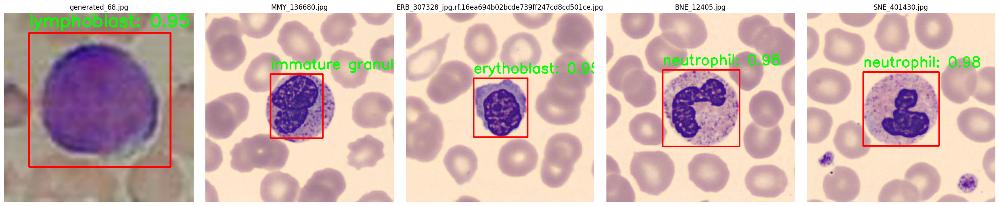

In [172]:
%matplotlib inline
# Load the trained model
model = YOLO("/Users/afnanag/projects/DH307/yolov11/runs/detect/train7/weights/best.pt")

# Path to validation images
val_img_dir = "/Users/afnanag/projects/DH307/yolov11/data/val/images"

# Get all image files in the validation directory
image_files = [f for f in os.listdir(val_img_dir) if f.endswith((".jpg", ".png", ".jpeg"))]

# Randomly select a subset of images (e.g., 5 images)
num_images = min(5, len(image_files))  # Adjust number if fewer images exist
random_imgs = random.sample(image_files, num_images)

# Set up the figure for multiple images
fig, axes = plt.subplots(1, num_images, figsize=(num_images * 5, 5))

if num_images == 1:
    axes = [axes]  # Ensure axes is iterable if only one image is selected

# Process each image
for ax, img_name in zip(axes, random_imgs):
    img_path = os.path.join(val_img_dir, img_name)

    # Predict
    results = model(img_path)
    result = results[0]  # Access first result

    # Load and convert image for display
    image = cv2.imread(img_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Extract bounding boxes
    boxes = result.boxes.xyxy.cpu().numpy()
    confidences = result.boxes.conf.cpu().numpy()
    class_indices = result.boxes.cls.cpu().numpy()

    # Draw bounding boxes
    for box, conf, class_idx in zip(boxes, confidences, class_indices):
        x1, y1, x2, y2 = map(int, box)
        label = f"{result.names[int(class_idx)]}: {conf:.2f}"
        cv2.rectangle(image_rgb, (x1, y1), (x2, y2), (255, 0, 0), 2)
        cv2.putText(image_rgb, label, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 255, 0), 2)

    # Display the image
    ax.imshow(image_rgb)
    ax.axis("off")
    ax.set_title(img_name)

plt.tight_layout()
plt.show()



## Validation on Individual Images

In [ ]:
model.val(data="/Users/afnanag/projects/DH307/yolov11/dataset.yaml")

Note: After running the code, relevant plots (including confusion matrix and precision-recall curves) are automatically saved in the default directory. These visualizations have been included in the presentation.

## Prediction on Combined Images


0: 384x384 1 erythoblast, 2 immature granulocytes, 3 neutrophils, 2 plateletss, 21.6ms
Speed: 1.0ms preprocess, 21.6ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 384)


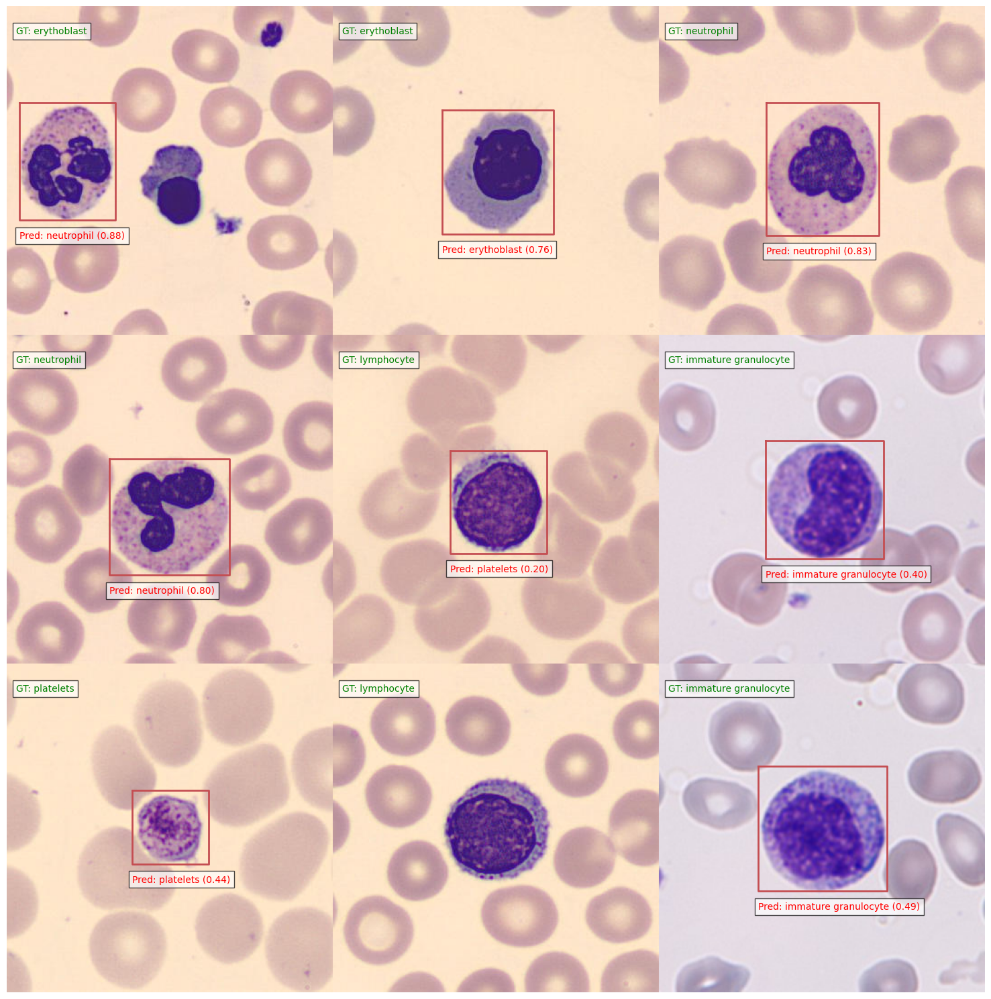

In [175]:
def read_label_file(label_path):
    """
    Read YOLO format label file and return class indices
    Args:
        label_path: Path to label file
    Returns:
        list of class indices
    """
    classes = []
    if label_path.exists():
        with open(label_path, 'r') as f:
            for line in f:
                # YOLO format: class x_center y_center width height
                class_idx = int(line.split()[0])
                classes.append(class_idx)
    return classes

def create_combined_image_with_labels(img_dir, label_dir, class_names, grid_size=(3, 3)):
    """
    Create a combined image from random validation images with their ground truth labels.
    Args:
        img_dir: Path to images directory
        label_dir: Path to labels directory
        class_names: Dictionary or list of class names
        grid_size: Tuple of (rows, cols) for the grid
    Returns:
        combined_img: Combined image array
        all_labels: List of labels for each image
        selected_images: List of selected image paths
    """
    # Get list of all validation images
    val_images = list(Path(img_dir).glob("*.jpg")) + list(Path(img_dir).glob("*.png"))
    
    # Randomly select images
    selected_images = random.sample(val_images, grid_size[0] * grid_size[1])
    
    # Read first image to get dimensions
    first_img = cv2.imread(str(selected_images[0]))
    img_height, img_width = first_img.shape[:2]
    
    # Create combined image canvas
    combined_img = np.zeros((img_height * grid_size[0], img_width * grid_size[1], 3), dtype=np.uint8)
    all_labels = []
    
    # Combine images and collect labels
    for idx, img_path in enumerate(selected_images):
        # Get corresponding label file path
        label_path = Path(label_dir) / (img_path.stem + '.txt')
        
        # Read image and labels
        img = cv2.imread(str(img_path))
        img = cv2.resize(img, (img_width, img_height))
        class_indices = read_label_file(label_path)
        
        # Convert class indices to names
        labels = [class_names[idx] for idx in class_indices]
        all_labels.append(labels)
        
        # Place image in grid
        row = idx // grid_size[1]
        col = idx % grid_size[1]
        y_start = row * img_height
        y_end = (row + 1) * img_height
        x_start = col * img_width
        x_end = (col + 1) * img_width
        combined_img[y_start:y_end, x_start:x_end] = img
        
    return combined_img, all_labels, selected_images

def visualize_predictions_and_truth(combined_img, all_labels, results, grid_size=(3, 3)):
    """
    Visualize both predictions and ground truth labels.
    Args:
        combined_img: Combined image array
        all_labels: List of ground truth labels for each image
        results: YOLO prediction results
        grid_size: Tuple of (rows, cols) for the grid
    """
    plt.figure(figsize=(15, 15))
    plt.imshow(cv2.cvtColor(combined_img, cv2.COLOR_BGR2RGB))
    
    img_height = combined_img.shape[0] // grid_size[0]
    img_width = combined_img.shape[1] // grid_size[1]
    
    # Add ground truth labels for each image (top left)
    for idx, labels in enumerate(all_labels):
        row = idx // grid_size[1]
        col = idx % grid_size[1]
        
        # Calculate position for ground truth text
        x = col * img_width + 10
        y = row * img_height + 30
        
        # Create ground truth label text
        gt_text = "GT: " + ', '.join(set(labels))  # Remove duplicates
        
        # Add white background behind text for better visibility
        plt.text(x, y, gt_text,
                bbox=dict(facecolor='white', alpha=0.7),
                fontsize=10,
                color='green')
    
    # Add predictions and boxes
    for result in results:
        boxes = result.boxes
        for box in boxes:
            # Get box coordinates and details
            x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
            conf = box.conf.cpu().numpy()[0]
            cls = box.cls.cpu().numpy()[0]
            
            # Draw box
            plt.plot([x1, x2, x2, x1, x1], [y1, y1, y2, y2, y1], 'r-', linewidth=2)
            
            # Add prediction label
            pred_text = f'Pred: {model.names[int(cls)]} ({conf:.2f})'
            plt.text(x1, y2 + 20, pred_text,
                    bbox=dict(facecolor='white', alpha=0.7),
                    fontsize=10,
                    color='red')
    
    plt.axis('off')
    plt.tight_layout()
    plt.show()

# Usage example:
label_dir = val_img_dir.replace('images', 'labels')

# Create a combined image with ground truth labels
combined_img, all_labels, selected_images = create_combined_image_with_labels(
    val_img_dir, 
    label_dir,
    model.names,  # Assuming model.names contains the class names
    grid_size=(3, 3)
)

# Run prediction on the combined image
results = model(combined_img, conf = 0.2)

# Visualize both predictions and ground truth
visualize_predictions_and_truth(combined_img, all_labels, results, grid_size=(3, 3))

In [176]:
# Prediction on saved image
cv2.imwrite('saved.png', combined_img)
resized_image = cv2.resize(combined_img, (384, 384))
cv2.imwrite('resized.png', resized_image)
results = model('resized.png', conf = 0.1)
# Since results is a list, access the first result (index 0)
result = results[0]

# Visualizing the results (this will display the image with bounding boxes and class labels)
result.show()


image 1/1 /Users/afnanag/projects/DH307/yolov11/resized.png: 384x384 1 erythoblast, 2 immature granulocytes, 1 lymphocyte, 3 neutrophils, 2 plateletss, 19.8ms
Speed: 0.5ms preprocess, 19.8ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 384)



0: 384x384 1 erythoblast, 2 immature granulocytes, 1 monocyte, 3 neutrophils, 28.0ms
Speed: 1.2ms preprocess, 28.0ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 384)


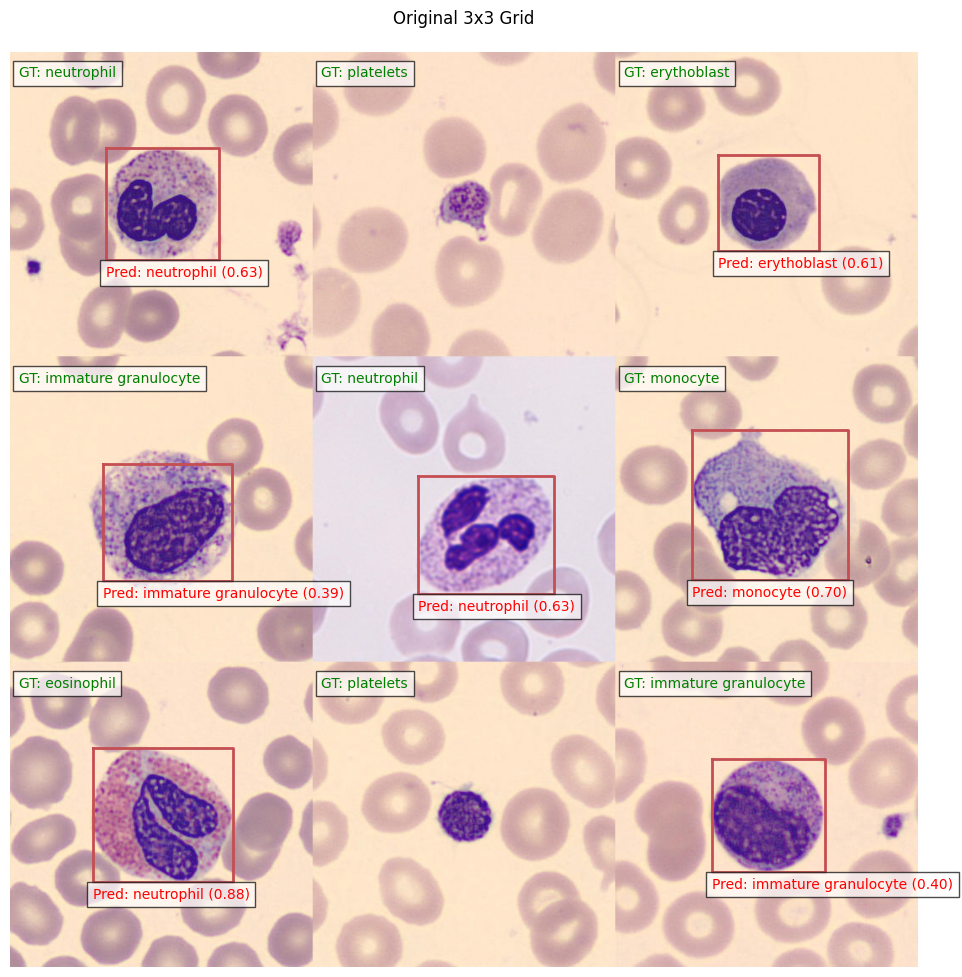


0: 384x384 1 erythoblast, 2 immature granulocytes, 1 monocyte, 3 neutrophils, 23.4ms
Speed: 0.9ms preprocess, 23.4ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 384)


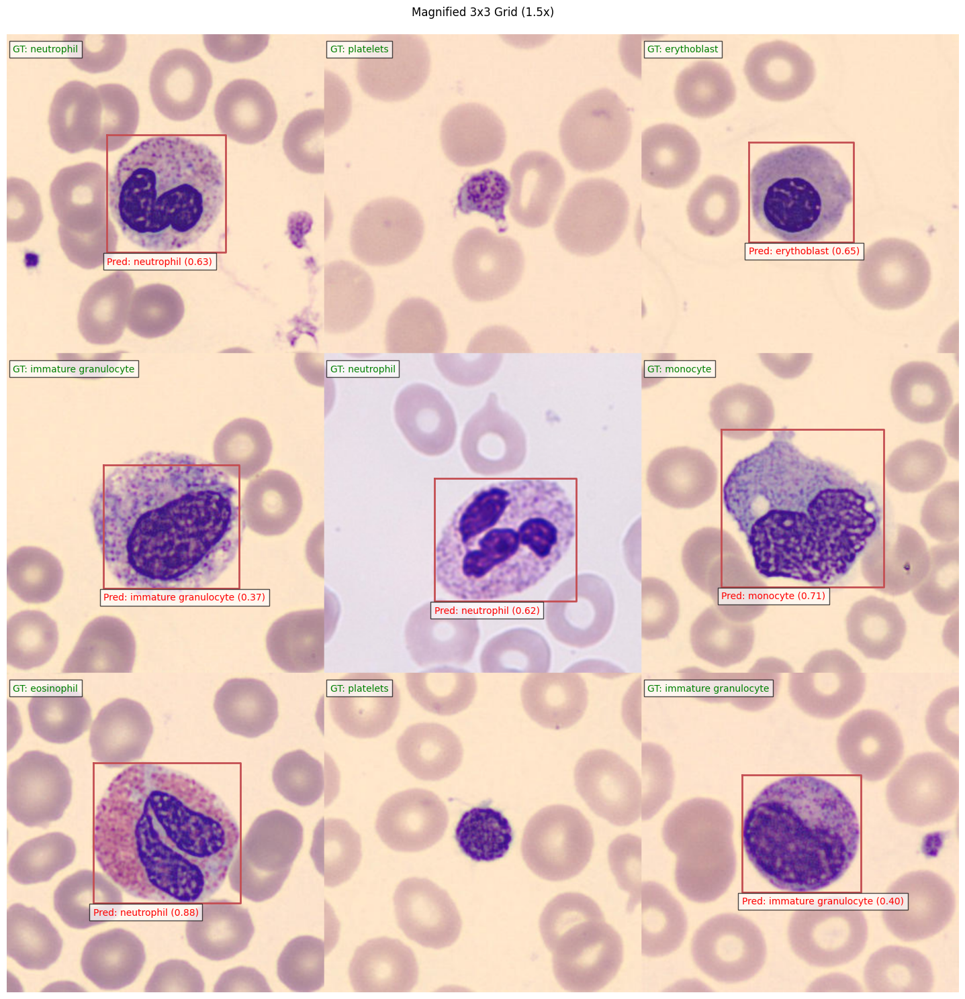


0: 224x384 1 neutrophil, 1 platelets, 15.6ms
Speed: 0.8ms preprocess, 15.6ms inference, 0.3ms postprocess per image at shape (1, 3, 224, 384)


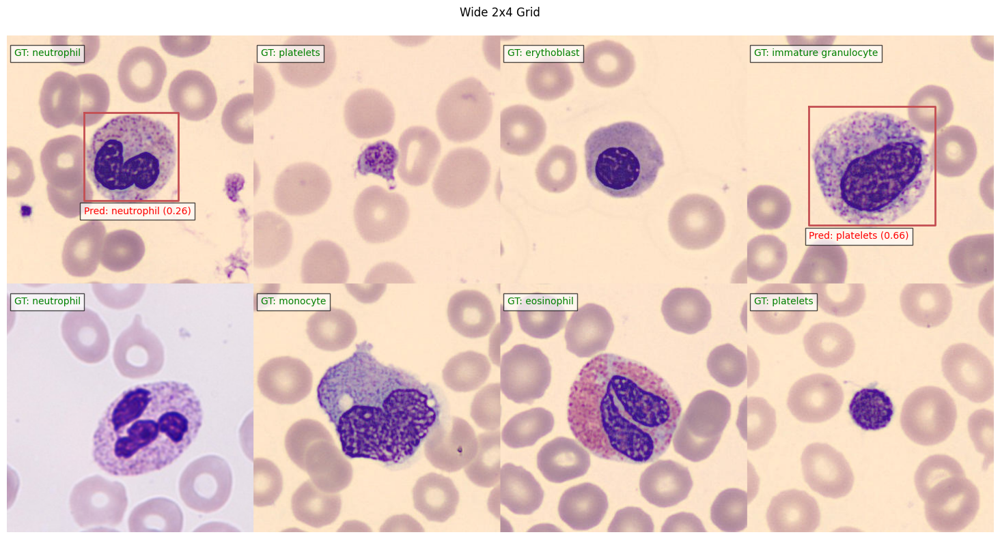


0: 288x384 1 erythoblast, 1 neutrophil, 3 plateletss, 28.1ms
Speed: 1.1ms preprocess, 28.1ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 384)


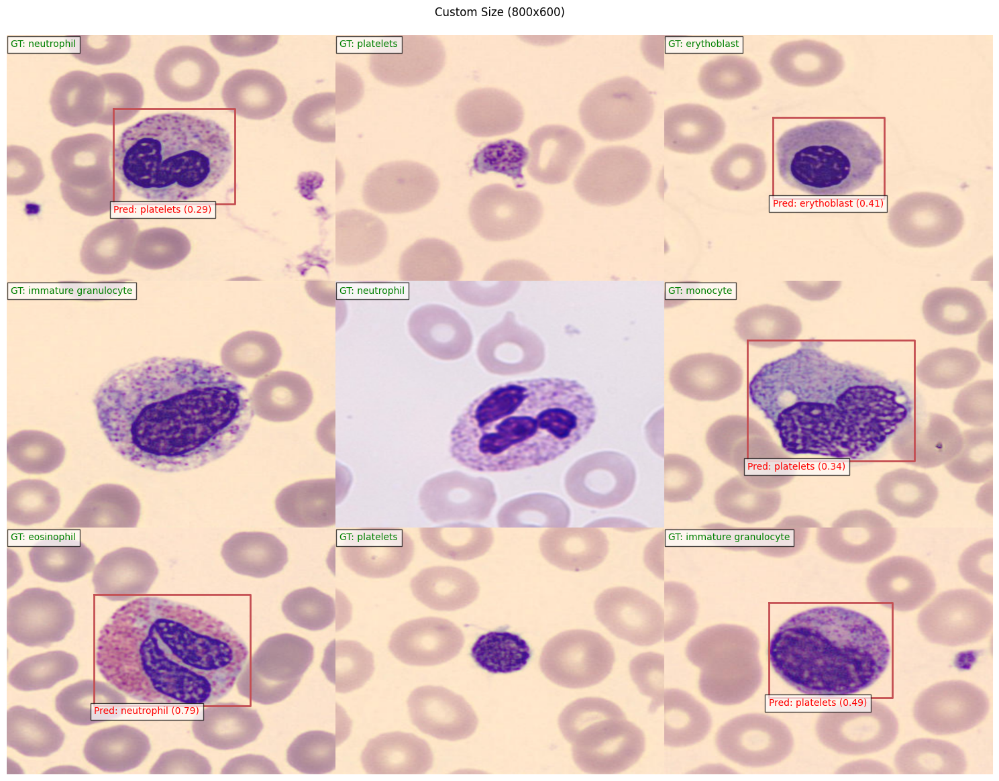

In [177]:
def select_random_images(img_dir, num_images):
    """
    Select random images from directory
    """
    val_images = list(Path(img_dir).glob("*.jpg")) + list(Path(img_dir).glob("*.png"))
    return random.sample(val_images, num_images)

def read_label_file(label_path):
    """
    Read YOLO format label file and return class indices
    """
    classes = []
    if label_path.exists():
        with open(label_path, 'r') as f:
            for line in f:
                class_idx = int(line.split()[0])
                classes.append(class_idx)
    return classes

def create_combined_image_with_labels(selected_images, label_dir, class_names, grid_size=(3, 3), 
                                    magnification=1.0, target_size=None):
    """
    Create combined image using pre-selected images
    """
    # Read first image to get base dimensions
    first_img = cv2.imread(str(selected_images[0]))
    orig_height, orig_width = first_img.shape[:2]
    
    # Calculate dimensions based on magnification or target size
    if target_size:
        img_width, img_height = target_size
    else:
        img_width = int(orig_width * magnification)
        img_height = int(orig_height * magnification)
    
    # Create combined image canvas
    combined_img = np.zeros((img_height * grid_size[0], img_width * grid_size[1], 3), 
                          dtype=np.uint8)
    all_labels = []
    
    for idx, img_path in enumerate(selected_images):
        label_path = Path(label_dir) / (img_path.stem + '.txt')
        img = cv2.imread(str(img_path))
        img = cv2.resize(img, (img_width, img_height))
        class_indices = read_label_file(label_path)
        labels = [class_names[idx] for idx in class_indices]
        all_labels.append(labels)
        
        row = idx // grid_size[1]
        col = idx % grid_size[1]
        y_start = row * img_height
        y_end = (row + 1) * img_height
        x_start = col * img_width
        x_end = (col + 1) * img_width
        combined_img[y_start:y_end, x_start:x_end] = img
        
    return combined_img, all_labels

def visualize_predictions_and_truth(combined_img, all_labels, results, grid_size=(3, 3), 
                                  figure_size=(10, 10), title=None):
    """
    Visualize predictions with optional title
    """
    plt.figure(figsize=figure_size)
    plt.imshow(cv2.cvtColor(combined_img, cv2.COLOR_BGR2RGB))
    
    if title:
        plt.title(title, pad=20)
    
    img_height = combined_img.shape[0] // grid_size[0]
    img_width = combined_img.shape[1] // grid_size[1]
    
    # Add ground truth labels
    for idx, labels in enumerate(all_labels):
        row = idx // grid_size[1]
        col = idx % grid_size[1]
        x = col * img_width + 10
        y = row * img_height + 30
        gt_text = "GT: " + ', '.join(set(labels))
        plt.text(x, y, gt_text,
                bbox=dict(facecolor='white', alpha=0.7),
                fontsize=10,
                color='green')
    
    # Add predictions and boxes
    for result in results:
        boxes = result.boxes
        for box in boxes:
            x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
            conf = box.conf.cpu().numpy()[0]
            cls = box.cls.cpu().numpy()[0]
            plt.plot([x1, x2, x2, x1, x1], [y1, y1, y2, y2, y1], 'r-', linewidth=2)
            pred_text = f'Pred: {model.names[int(cls)]} ({conf:.2f})'
            plt.text(x1, y2 + 20, pred_text,
                    bbox=dict(facecolor='white', alpha=0.7),
                    fontsize=10,
                    color='red')
    
    plt.axis('off')
    plt.tight_layout()
    plt.show()

# Example usage with same images:
def run_multiple_visualizations(val_img_dir, label_dir, model, num_images=9):
    # First, select the images we'll use for all visualizations
    selected_images = select_random_images(val_img_dir, num_images)
    
    # 1. Basic 3x3 grid
    combined_img, all_labels = create_combined_image_with_labels(
        selected_images, 
        label_dir,
        model.names,
        grid_size=(3, 3)
    )
    results = model(combined_img)
    visualize_predictions_and_truth(combined_img, all_labels, results, 
                                  grid_size=(3, 3),
                                  title="Original 3x3 Grid")

    # 2. Same images with magnification
    combined_img_mag, all_labels = create_combined_image_with_labels(
        selected_images, 
        label_dir,
        model.names,
        grid_size=(3, 3),
        magnification=1.5
    )
    results_mag = model(combined_img_mag)
    visualize_predictions_and_truth(combined_img_mag, all_labels, results_mag, 
                                  grid_size=(3, 3),
                                  figure_size=(15, 15),
                                  title="Magnified 3x3 Grid (1.5x)")

    # 3. Same images in 2x4 grid (using first 8 images)
    combined_img_wide, all_labels_wide = create_combined_image_with_labels(
        selected_images[:8], 
        label_dir,
        model.names,
        grid_size=(2, 4)
    )
    results_wide = model(combined_img_wide)
    cv2.imwrite('output_wide.png', combined_img_wide)
    visualize_predictions_and_truth(combined_img_wide, all_labels_wide, results_wide, 
                                  grid_size=(2, 4),
                                  figure_size=(16, 8),
                                  title="Wide 2x4 Grid")

    # 4. Same images with custom size
    combined_img_custom, all_labels = create_combined_image_with_labels(
        selected_images, 
        label_dir,
        model.names,
        grid_size=(3, 3),
        target_size=(800, 600)
    )
    results_custom = model(combined_img_custom)
    visualize_predictions_and_truth(combined_img_custom, all_labels, results_custom, 
                                  grid_size=(3, 3),
                                  figure_size=(15, 15),
                                  title="Custom Size (800x600)")

# Run all visualizations
label_dir = val_img_dir.replace('images', 'labels')
run_multiple_visualizations(val_img_dir, label_dir, model)

# To save any particular visualization:
# cv2.imwrite('output_magnified.png', combined_img_mag)
# cv2.imwrite('output_wide.png', combined_img_wide)
# cv2.imwrite('output_custom.png', combined_img_custom)


image 1/1 /Users/afnanag/projects/DH307/yolov11/resized_output.png: 384x384 1 eosinophil, 1 erythoblast, 1 immature granulocyte, 1 monocyte, 3 neutrophils, 27.5ms
Speed: 0.9ms preprocess, 27.5ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 384)


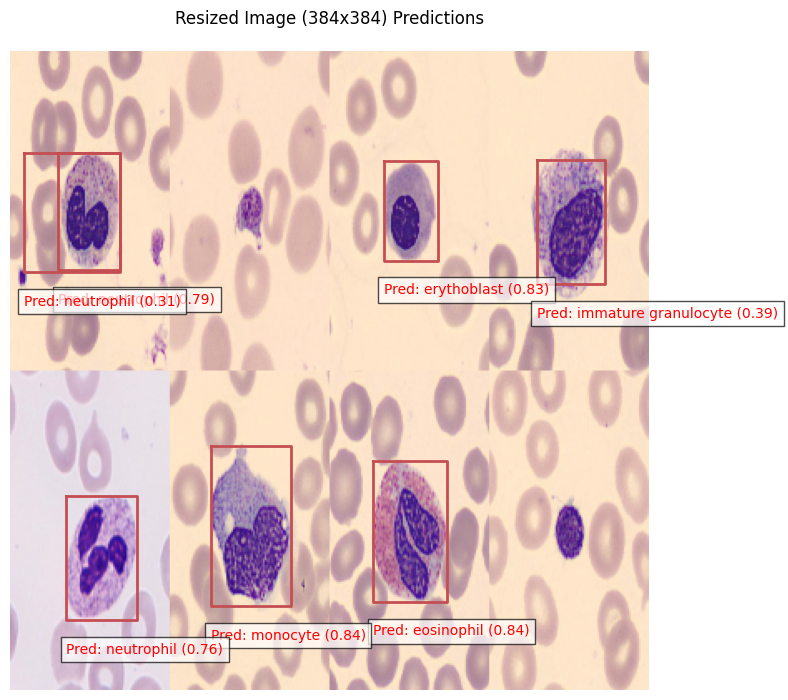

In [178]:
# Predicting the 2x4 grid image after resizing
# Load the image
image = cv2.imread('output_wide.png')

# Resize to 384x384
resized_image = cv2.resize(image, (384, 384))

# Save the resized image (optional, if needed for debugging)
cv2.imwrite('resized_output.png', resized_image)

# Perform inference
results = model('resized_output.png')

# Perform visualization for the resized image
visualize_predictions_and_truth(resized_image, [], results, 
                              grid_size=(1, 1),  # Single image, so 1x1 grid
                              figure_size=(8, 8),  
                              title="Resized Image (384x384) Predictions")


In [179]:
def evaluate_combined_predictions(img_dir, label_dir, model, class_names, grid_size=(3, 3), conf_threshold=0.4):
    """
    Evaluate model performance on combined validation images.
    """
    val_images = list(Path(img_dir).glob("*.jpg")) + list(Path(img_dir).glob("*.png"))
    
    total_metrics = {
        'true_positives': 0,
        'false_positives': 0,
        'false_negatives': 0,
        'total_predictions': 0,
        'total_ground_truth': 0
    }
    
    # Process images in batches of grid_size
    for i in range(0, len(val_images), grid_size[0] * grid_size[1]):
        batch_images = val_images[i:i + grid_size[0] * grid_size[1]]
        if len(batch_images) < grid_size[0] * grid_size[1]:
            break
            
        # Read first image to get dimensions
        first_img = cv2.imread(str(batch_images[0]))
        img_height, img_width = first_img.shape[:2]
        
        # Create combined image canvas
        combined_img = np.zeros((img_height * grid_size[0], img_width * grid_size[1], 3), dtype=np.uint8)
        
        # Store ground truth for each position
        ground_truths = []
        
        # Combine images and collect ground truth labels
        for idx, img_path in enumerate(batch_images):
            label_path = Path(label_dir) / (img_path.stem + '.txt')
            
            # Read and place image
            img = cv2.imread(str(img_path))
            img = cv2.resize(img, (img_width, img_height))
            
            row = idx // grid_size[1]
            col = idx % grid_size[1]
            y_start = row * img_height
            y_end = (row + 1) * img_height
            x_start = col * img_width
            x_end = (col + 1) * img_width
            combined_img[y_start:y_end, x_start:x_end] = img
            
            # Read ground truth
            class_indices = read_label_file(label_path)
            ground_truths.extend(class_indices)
            total_metrics['total_ground_truth'] += len(class_indices)
        
        # Run prediction on combined image
        results = model(combined_img)
        
        # Process predictions
        predictions = []
        for result in results:
            boxes = result.boxes
            for box in boxes:
                if box.conf.cpu().numpy()[0] >= conf_threshold:
                    predictions.append(int(box.cls.cpu().numpy()[0]))
                    total_metrics['total_predictions'] += 1
        
        # Calculate matches
        matched_gt = set()
        matched_pred = set()
        
        # Match predictions to ground truth
        for pred_idx, pred_class in enumerate(predictions):
            for gt_idx, gt_class in enumerate(ground_truths):
                if gt_idx not in matched_gt and pred_class == gt_class:
                    total_metrics['true_positives'] += 1
                    matched_gt.add(gt_idx)
                    matched_pred.add(pred_idx)
                    break
        
        # Calculate false positives and negatives
        total_metrics['false_positives'] += len(predictions) - len(matched_pred)
        total_metrics['false_negatives'] += len(ground_truths) - len(matched_gt)
    
    # Calculate final metrics
    tp = total_metrics['true_positives']
    fp = total_metrics['false_positives']
    fn = total_metrics['false_negatives']
    
    precision = tp / (tp + fp) if (tp + fp) > 0 else 0
    recall = tp / (tp + fn) if (tp + fn) > 0 else 0
    f1_score = 2 * (precision * recall) / (precision + recall) if (precision + recall) > 0 else 0
    
    final_metrics = {
        'true_positives': tp,
        'false_positives': fp,
        'false_negatives': fn,
        'precision': precision,
        'recall': recall,
        'f1_score': f1_score,
        'total_predictions': total_metrics['total_predictions'],
        'total_ground_truth': total_metrics['total_ground_truth'],
        'average_predictions_per_image': total_metrics['total_predictions'] / len(val_images),
        'accuracy': tp / (tp + fp + fn) if (tp + fp + fn) > 0 else 0
    }
    
    return final_metrics

# Add some debug printing to help understand what's happening
def debug_print_batch(ground_truths, predictions, matched_gt, matched_pred):
    print("\nDebug Information:")
    print(f"Ground Truths: {ground_truths}")
    print(f"Predictions: {predictions}")
    print(f"Matched GT indices: {matched_gt}")
    print(f"Matched Pred indices: {matched_pred}")

# Usage example:
metrics = evaluate_combined_predictions(
    val_img_dir,
    label_dir,
    model,
    model.names,
    grid_size=(2, 2),
    conf_threshold=0.2
)

print("\nOverall Metrics:")
for metric, value in metrics.items():
    if isinstance(value, float):
        print(f"{metric}: {value:.3f}")
    else:
        print(f"{metric}: {value}")


0: 384x384 2 erythoblasts, 1 immature granulocyte, 1 platelets, 22.5ms
Speed: 0.8ms preprocess, 22.5ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 384)

0: 384x384 1 basophil, 1 eosinophil, 2 plateletss, 20.2ms
Speed: 0.7ms preprocess, 20.2ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 384)

0: 384x384 3 immature granulocytes, 1 neutrophil, 1 platelets, 21.2ms
Speed: 0.7ms preprocess, 21.2ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 384)

0: 384x384 2 eosinophils, 2 lymphocytes, 21.1ms
Speed: 0.9ms preprocess, 21.1ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 384)

0: 384x384 2 eosinophils, 1 erythoblast, 1 immature granulocyte, 19.9ms
Speed: 0.7ms preprocess, 19.9ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 384)

0: 384x384 1 immature granulocyte, 1 monocyte, 2 plateletss, 20.1ms
Speed: 0.7ms preprocess, 20.1ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 384)

0: 384x384 3 immature gr